In [1]:
include("opt-all-pair.jl");
include("ion13-params.jl");

In [2]:
using PyPlot

In [3]:
meta, candidates = @time load_candidates_dir("data/ion13_0.7r/");

136.819801 seconds (713.83 M allocations: 33.700 GiB, 7.38% gc time, 7 lock conflicts, 1.57% compilation time)


In [4]:
length(candidates)

1085968

In [5]:
const mode_info = GateModeInfo(2π .* fs, ηs, bij)

GateModeInfo([14.39157311424177, 14.528169562819855, 14.667907604051528, 14.806954494899411, 14.951719084376832, 15.091394293755434, 15.226985432684367, 15.358429669310565, 15.477056207910115, 15.586572127814255, 15.685532296402336, 15.769601315812396, 15.811572993664358], [0.12715336323095702, 0.12655419219536254, 0.12594992210444297, 0.125357151533792, 0.12474881290310921, 0.12417017779990008, 0.1236160949097755, 0.12308597761008097, 0.12261336351972282, 0.12218184509767159, 0.12179581206641138, 0.12147072656317505, 0.12130939795685286], [0.002163619698947626 -0.019894333993010195 … -0.019894333993005258 0.0021636196989478743; 0.0071396181636678106 -0.05753283102846898 … 0.05753283102846495 -0.007139618163669534; … ; 0.42615110225953595 0.36754442103650975 … -0.36754442103645346 -0.4261511022594881; 0.2773500981126128 0.2773500981125969 … 0.27735009811265454 0.27735009811265965], [4.4e-323, 6.0e-323, 1.39064271585167e-309, 1.390642715851986e-309, 6.4e-323, 7.0e-323, 1.390642715852144

In [6]:
function get_area(sol::Seq.SolutionProperties, weights)
    return sum(weights .* @view(sol.area[1:length(weights)]))
end
function get_areaδ(sol::Seq.SolutionProperties, weights)
    return sum(weights .* @view(sol.areaδ[1:length(weights)]))
end
function get_sol_info(sols::Candidate)
    return (sols.props,)
end
function get_sol_info(cands::AbstractVector{<:Candidate})
    return (s for c in cands for s in get_sol_info(c))
end

function get_all_areas(data, weights)
    total_times = Float64[]
    areas = Float64[]
    for sol in get_sol_info(data)
        push!(total_times, sol.total_time)
        push!(areas, get_area(sol, weights))
    end
    return total_times, areas
end
function get_all_areaδs(data, weights)
    total_times = Float64[]
    areaδs = Float64[]
    for sol in get_sol_info(data)
        push!(total_times, sol.total_time)
        push!(areaδs, get_areaδ(sol, weights))
    end
    return total_times, areaδs
end
function get_all_rel_areaδs(data, weights)
    total_times = Float64[]
    areaδs = Float64[]
    for sol in get_sol_info(data)
        push!(total_times, sol.total_time)
        push!(areaδs, get_areaδ(sol, weights) / get_area(sol, weights))
    end
    return total_times, areaδs
end
function get_all_area_rel_areaδs(data, weights)
    total_times = Float64[]
    areas = Float64[]
    areaδs = Float64[]
    for sol in get_sol_info(data)
        push!(total_times, sol.total_time)
        area = get_area(sol, weights)
        areaδ = get_areaδ(sol, weights)
        push!(areas, area)
        push!(areaδs, areaδ / area)
    end
    return total_times, areas, areaδs
end

get_all_area_rel_areaδs (generic function with 1 method)

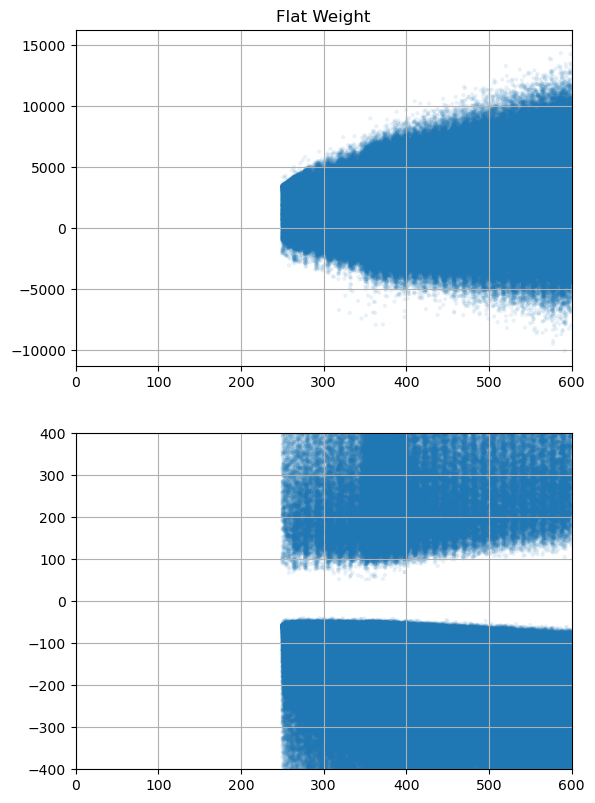

(-400.0, 400.0)

In [7]:
weights_flat = (1, 1, 1, 1, 1, 1, 1)
figure(figsize=[6.4, 4.8 * 2])
subplot(2, 1, 1)
title("Flat Weight")
scatter(get_all_areas(candidates, weights_flat)..., marker=".", alpha=0.1, color="C0", edgecolors="none")
grid()
xlim([0, 600])

subplot(2, 1, 2)
scatter(get_all_rel_areaδs(candidates, weights_flat)..., marker=".", alpha=0.1, color="C0", edgecolors="none")
grid()
xlim([0, 600])
ylim([-400, 400])

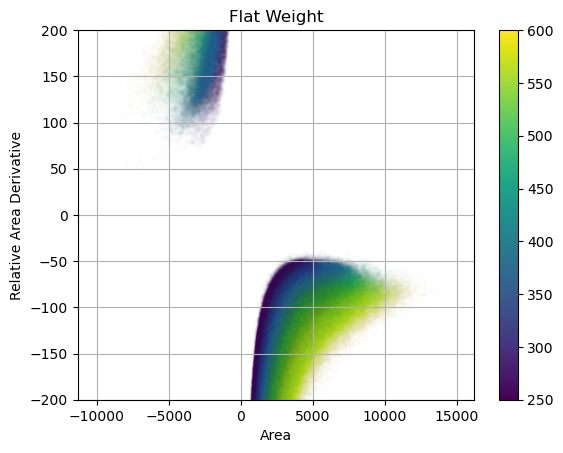

PyObject Text(0.5, 1.0, 'Flat Weight')

In [8]:
ts, as, aδs = get_all_area_rel_areaδs(candidates, (1, 1, 1, 1, 1, 1, 1))
scatter(as, aδs, c=ts, marker=".", alpha=0.01, edgecolors="none")
grid()
xlabel("Area")
ylabel("Relative Area Derivative")
ylim([-200, 200])
cbar = colorbar()
cbar.solids.set(alpha=1)
title("Flat Weight")

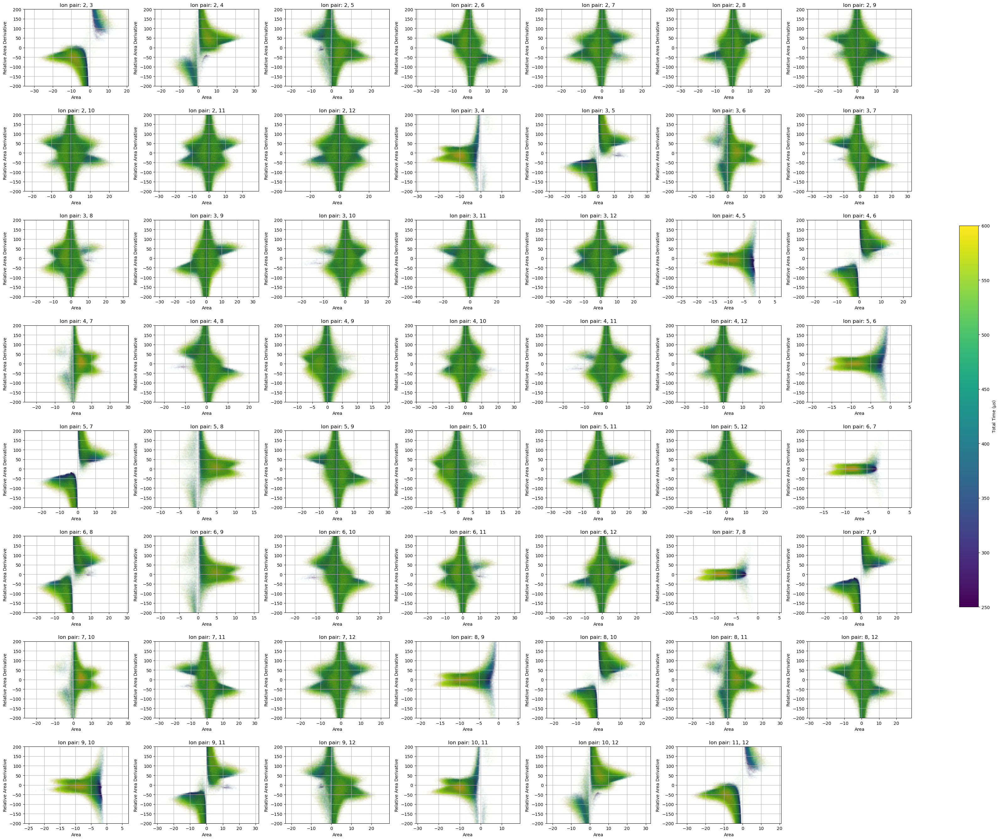

In [9]:
fig = figure(figsize=[6.4 * 7 * 0.7, 4.8 * 8 * 0.7])
axes = []
for ion1 in 2:11
    for ion2 in ion1 + 1:12
        global sp
        push!(axes, subplot(8, 7, length(axes) + 1))
        ts, as, aδs = get_all_area_rel_areaδs(candidates, get_weights!(mode_info, ion1, ion2))
        sp = scatter(as, aδs, c=ts, marker=".", alpha=0.01, edgecolors="none")
        grid()
        xlabel("Area")
        ylabel("Relative Area Derivative")
        ylim([-200, 200])
        title("Ion pair: $(ion1), $(ion2)")
    end
end
tight_layout(h_pad=2)
cbar = fig.colorbar(sp, ax=axes, shrink=0.6, fraction=0.02, label=raw"Total Time ($\mu s$)")
cbar.solids.set(alpha=1)
savefig("imgs/opt4_ion13_area_2d_rel.png"; bbox_inches="tight", transparent=true)

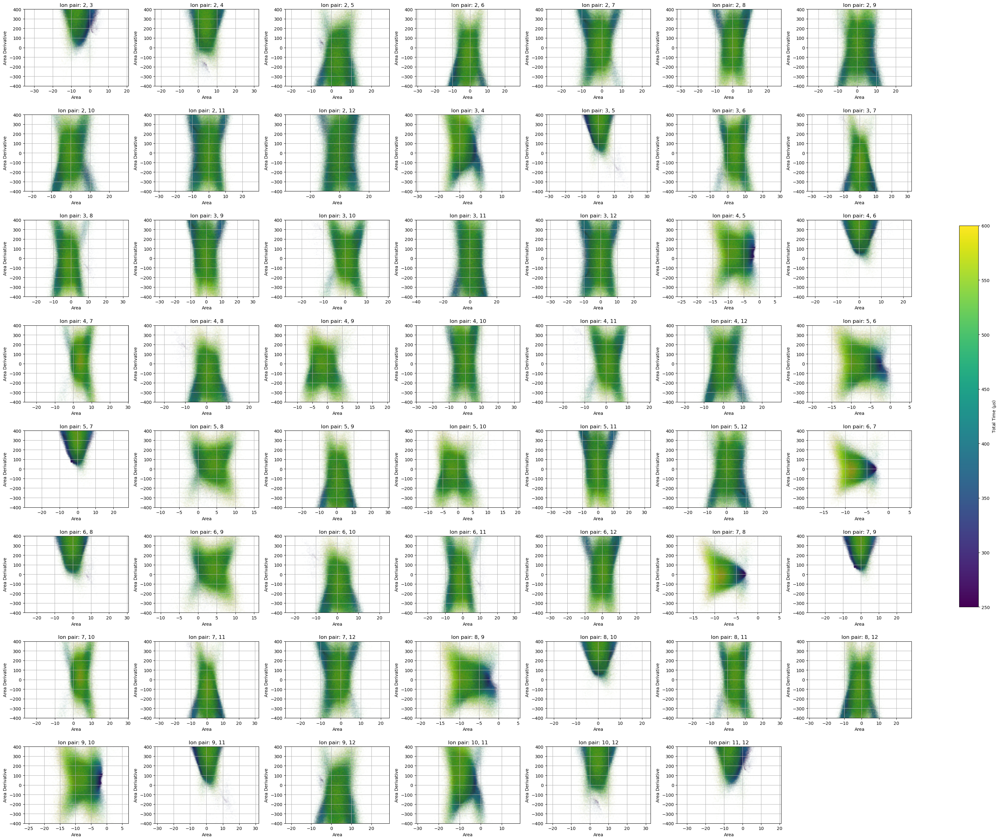

In [10]:
fig = figure(figsize=[6.4 * 7 * 0.7, 4.8 * 8 * 0.7])
axes = []
for ion1 in 2:11
    for ion2 in ion1 + 1:12
        global sp
        push!(axes, subplot(8, 7, length(axes) + 1))
        ts, as, aδs = get_all_area_rel_areaδs(candidates, get_weights!(mode_info, ion1, ion2))
        sp = scatter(as, as .* aδs, c=ts, marker=".", alpha=0.01, edgecolors="none")
        grid()
        xlabel("Area")
        ylabel("Area Derivative")
        ylim([-400, 400])
        title("Ion pair: $(ion1), $(ion2)")
    end
end
tight_layout(h_pad=2)
cbar = fig.colorbar(sp, ax=axes, shrink=0.6, fraction=0.02, label=raw"Total Time ($\mu s$)")
cbar.solids.set(alpha=1)
savefig("imgs/opt4_ion13_area_2d_abs.png"; bbox_inches="tight", transparent=true)